In [1]:
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc




In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams["savefig.dpi"] = 300
plt.rcParams["figure.figsize"] = [6, 4.5]

In [3]:
adata = sc.read('/Users/derekebowman/Coding Projects/taPVAT_snRNAseq_analysis/code/scVelo_and_CellOracle/CellOracle/Full_taPVAT_combined_annotated_with_immune_fibro_ecs_all_genes_unnormalized.h5ad')


In [4]:
adata = adata[adata.obs['celltype'] == 'Adipocytes_Brown']
adata = adata[adata.obs['sex'] == 'F']
adata = adata[adata.obs['time'] == '24W']


In [5]:
adata

View of AnnData object with n_obs × n_vars = 9344 × 20743
    obs: 'sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'n_genes', 'scDblFinder_score', 'scDblFinder_class', 'Sample', 'tissue', 'diet', 'time', 'sex', 'batch', 'sample_type', 'rat_id', 'weight_3W', 'weight_10W', 'weight_17W', 'weight_24W', 'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W', 'MAP_16W', 'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W', 'doublet', 'celltype', 'celltype_broad'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    layers: 'counts', 'raw_counts', 'soupX_counts'

In [6]:
def TimeDiet(row):
    if row['time'] == '8W' and row['diet'] == 'Control':
        return '8W_Control'
    elif row['time'] == '8W' and row['diet'] == 'HF':
        return '8W_HF'
    elif row['time'] == '24W' and row['diet'] == 'HF':
        return '24W_HF'
    elif row['time'] == '24W' and row['diet'] == 'Control':
        return '24W_Control'
    else:
        return 'There was an error'


In [7]:
# Apply the function to each row in adata.obs
adata.obs['time_diet'] = adata.obs.apply(TimeDiet, axis=1)

/var/folders/3v/fv2nh3dj3z9b9bkz4lcmhvq80000gn/T/ipykernel_45782/774351158.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['time_diet'] = adata.obs.apply(TimeDiet, axis=1)


In [8]:
adata.obs[adata.obs.time_diet == 'There was an error']

,sample_id,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,...,MAP_9W,systolic_bp_9W,MAP_16W,systolic_bp_16W,MAP_24W,systolic_bp_24W,doublet,celltype,celltype_broad,time_diet


# CellOracle Preprocessing 
https://morris-lab.github.io/CellOracle.documentation/notebooks/03_scRNA-seq_data_preprocessing/scanpy_preprocessing_with_Paul_etal_2015_data.html#Notebook-file

In [9]:
# Only consider genes with more than 1 count
sc.pp.filter_genes(adata, min_counts=1)

In [10]:
# Normalize gene expression matrix with total UMI count per cell
sc.pp.normalize_per_cell(adata, key_n_counts='n_counts_all')

In [11]:
# Select top 2000 highly-variable genes
filter_result = sc.pp.filter_genes_dispersion(adata.X,
                                              flavor='cell_ranger',
                                              n_top_genes=2000,
                                              log=False)

# Subset the genes
adata = adata[:, filter_result.gene_subset]

# Renormalize after filtering
sc.pp.normalize_per_cell(adata)



OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
/Users/derekebowman/miniconda3/envs/CellOracle/lib/python3.10/site-packages/scanpy-1.10.2-py3.10.egg/scanpy/preprocessing/_simple.py:569: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_n_counts] = counts_per_cell


In [12]:
# keep raw cont data before log transformation
adata.raw = adata
adata.layers["raw_count"] = adata.raw.X.copy()
# Log transformation and scaling
sc.pp.log1p(adata)
sc.pp.scale(adata)

In [13]:
# PCA
sc.tl.pca(adata, svd_solver='arpack')

# Diffusion map
sc.pp.neighbors(adata, n_neighbors=4, n_pcs=20)

sc.tl.diffmap(adata)
# Calculate neihbors again based on diffusionmap
sc.pp.neighbors(adata, n_neighbors=10, use_rep='X_diffmap')

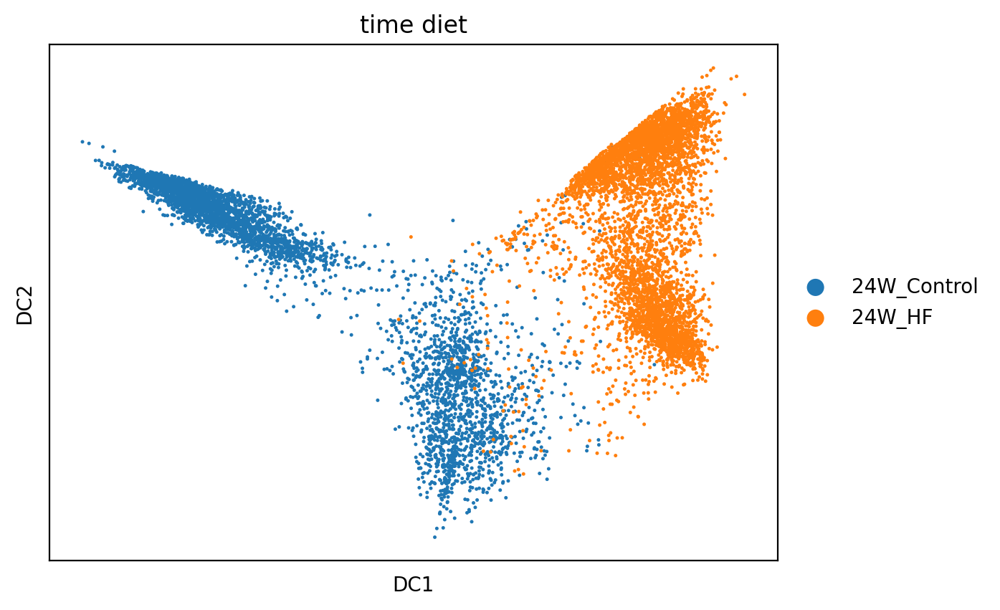

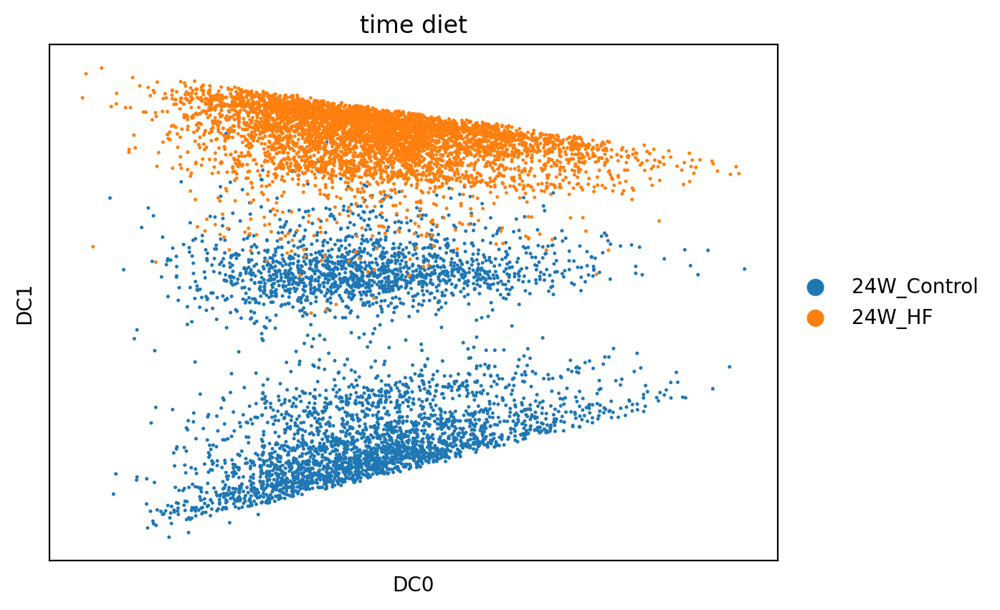

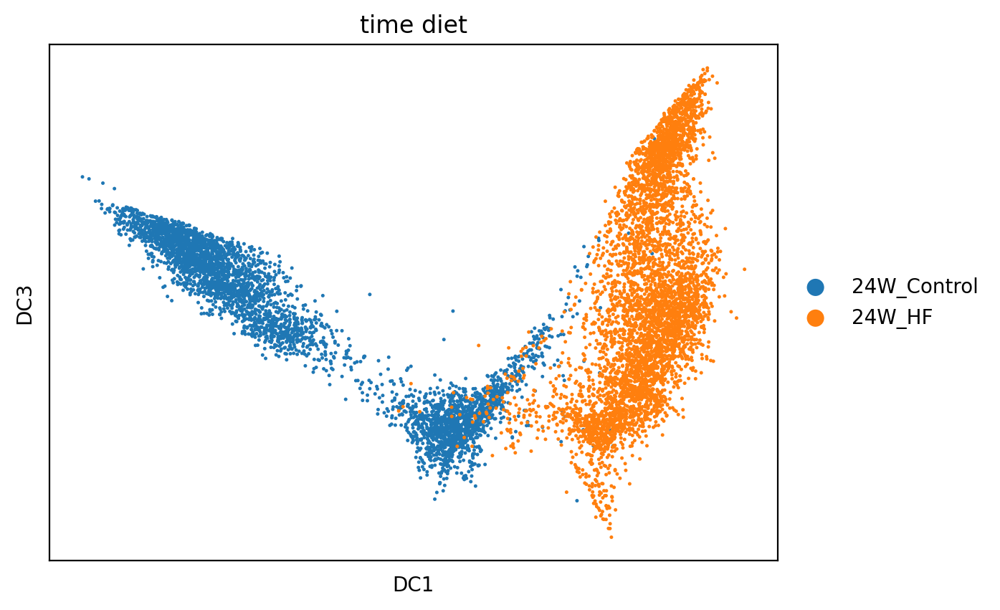

In [14]:
# Taking a look at the diffusion map plots
sc.pl.scatter(adata, 
              basis="diffmap", 
              color=["time_diet"],
              components= [1,2])

sc.pl.scatter(adata, 
              basis="diffmap", 
              color=["time_diet"],
              components= [0,1])

sc.pl.scatter(adata, 
              basis="diffmap", 
              color=["time_diet"],
              components= [1,3])


In [15]:
# Using leiden instead of louvain
sc.tl.leiden(adata, resolution=0.8)

/var/folders/3v/fv2nh3dj3z9b9bkz4lcmhvq80000gn/T/ipykernel_45782/1054681846.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=0.8)


In [16]:
# PAGA graph construction
sc.tl.paga(adata, groups='leiden')

In [17]:
plt.rcParams["figure.figsize"] = [6, 4.5]

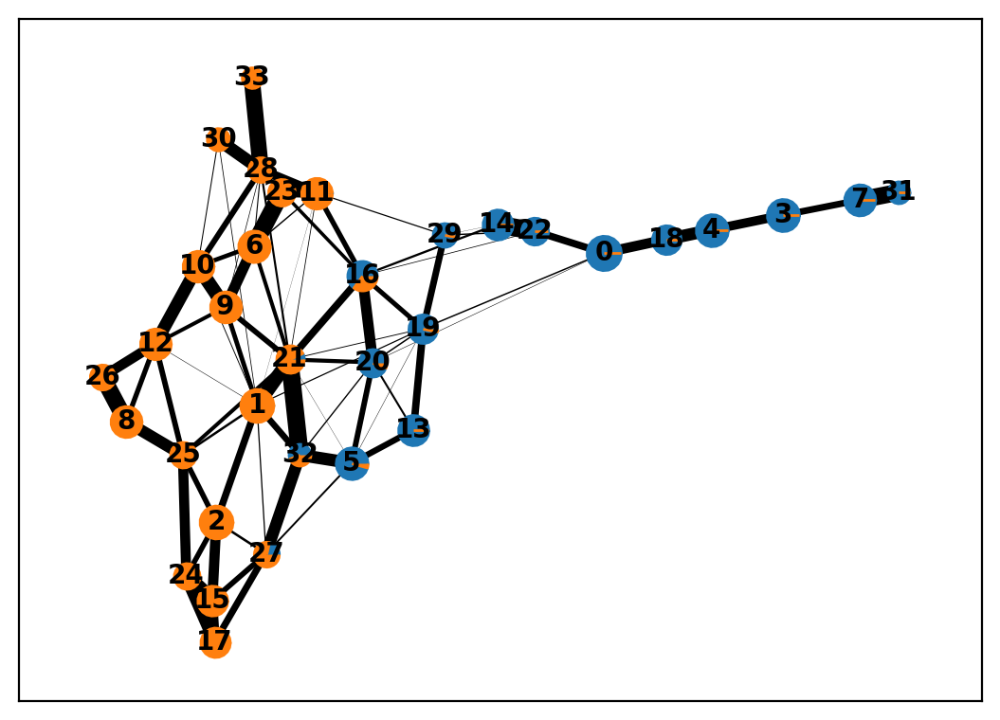

In [18]:
sc.pl.paga(adata, color = 'time_diet')

In [19]:
sc.tl.draw_graph(adata, init_pos='paga', random_state=123)



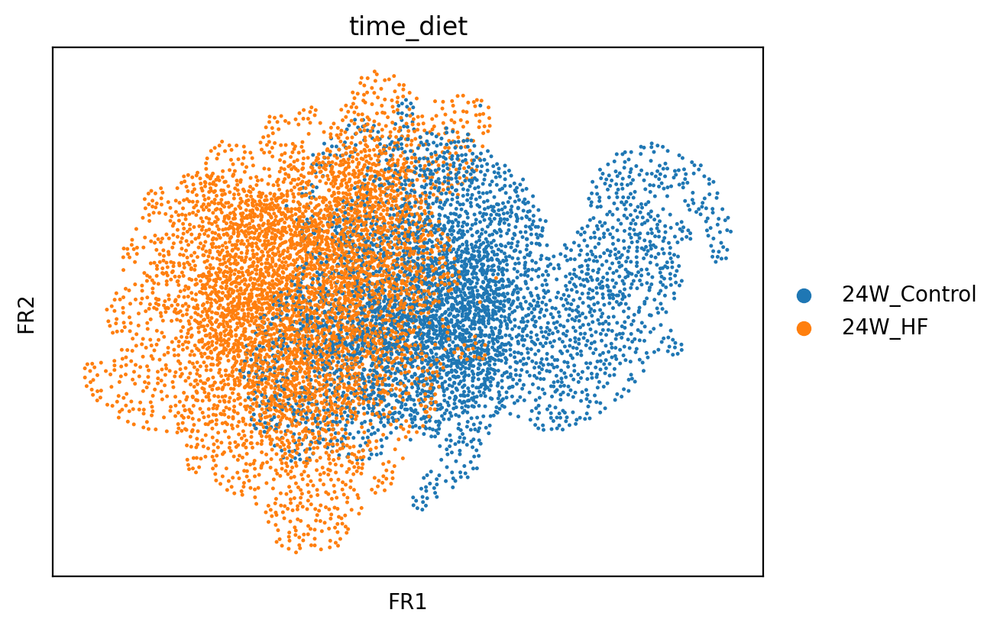

In [20]:
sc.pl.draw_graph(adata, color='time_diet', legend_loc='right margin')



In [21]:
# Save data if desired
# adata.write_h5ad("Your_File_Name_Here.h5ad")

# Preprocessing complete, now Pseudotime Calculation

https://cellrank.readthedocs.io/en/latest/notebooks/tutorials/kernels/300_pseudotime.html

https://morris-lab.github.io/CellOracle.documentation/notebooks/05_simulation/Pseudotime_calculation_with_Paul_etal_2015_data.html



In [22]:
import copy
import glob
import time
import os
import shutil
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
from tqdm.auto import tqdm

In [23]:
import celloracle as co
from celloracle.applications import Pseudotime_calculator
co.__version__

'0.18.0'

In [24]:
# Since I could not install fa2, 
# I am creating a new column called X_draw_graph_fa
# that is equivalent to X_draw_graph_fr
adata.obsm['X_draw_graph_fa'] = adata.obsm['X_draw_graph_fr'].copy()

In [25]:
adata.obsm

AxisArrays with keys: X_pca, X_diffmap, X_draw_graph_fr, X_draw_graph_fa

In [26]:
#plt.rcParams["font.family"] = "arial"
plt.rcParams["figure.figsize"] = [5,5]
%config InlineBackend.figure_format = 'retina'
plt.rcParams["savefig.dpi"] = 300

%matplotlib inline

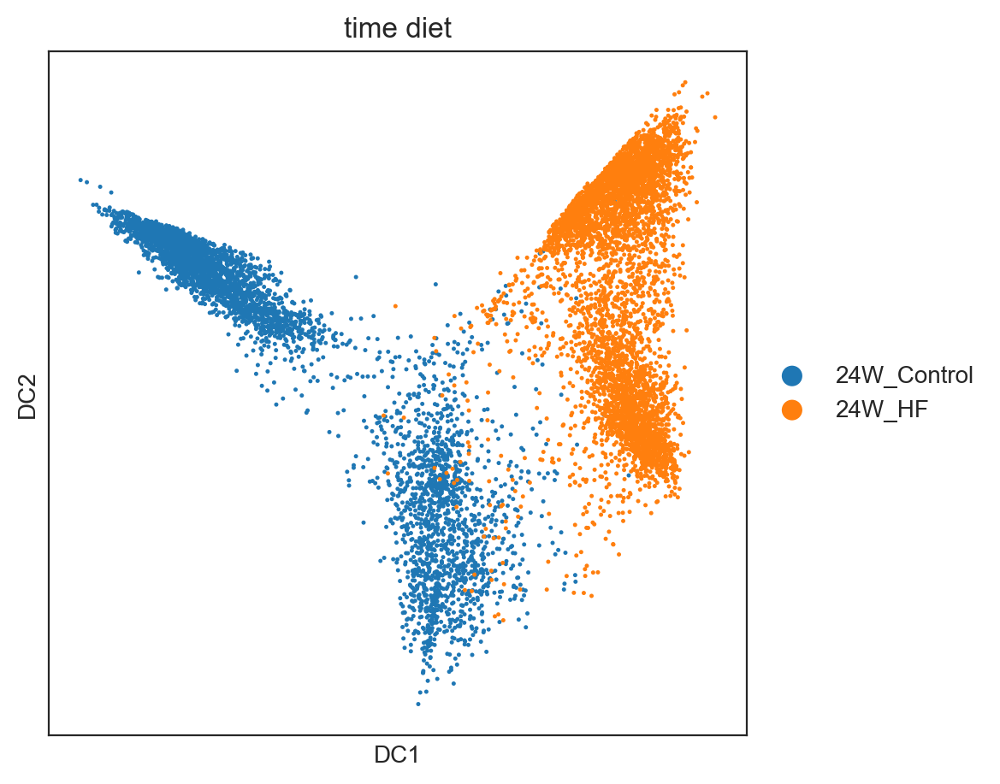

In [27]:
# Plot diffusion map by diet
sc.pl.scatter(adata, 
              basis="diffmap", 
              color="time_diet")

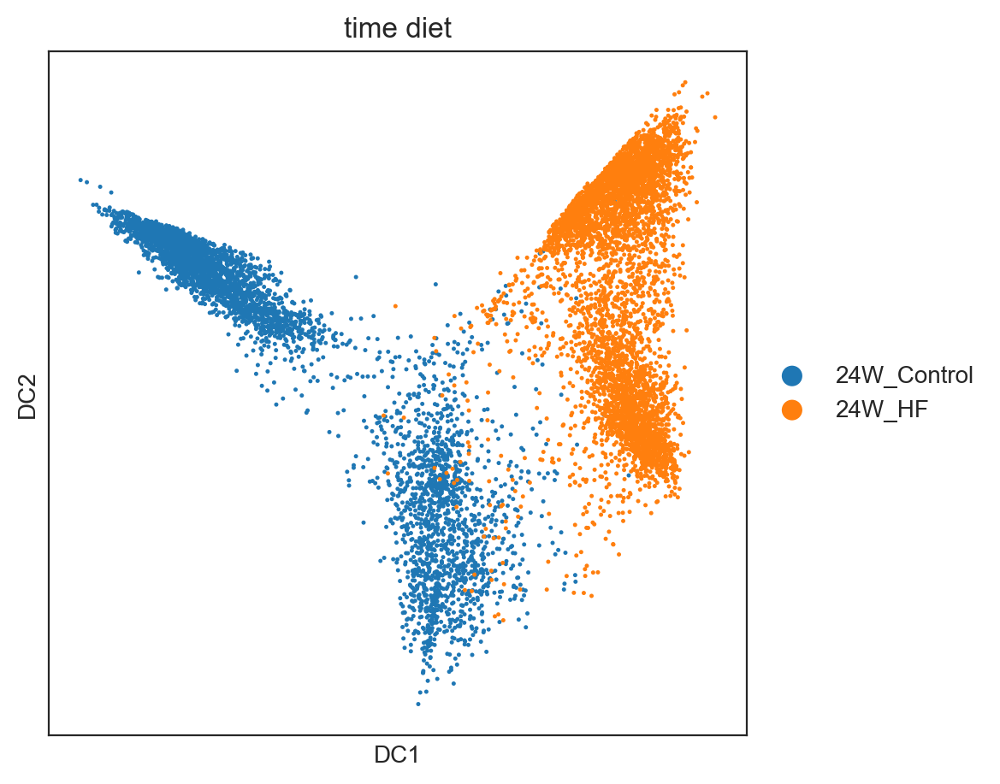

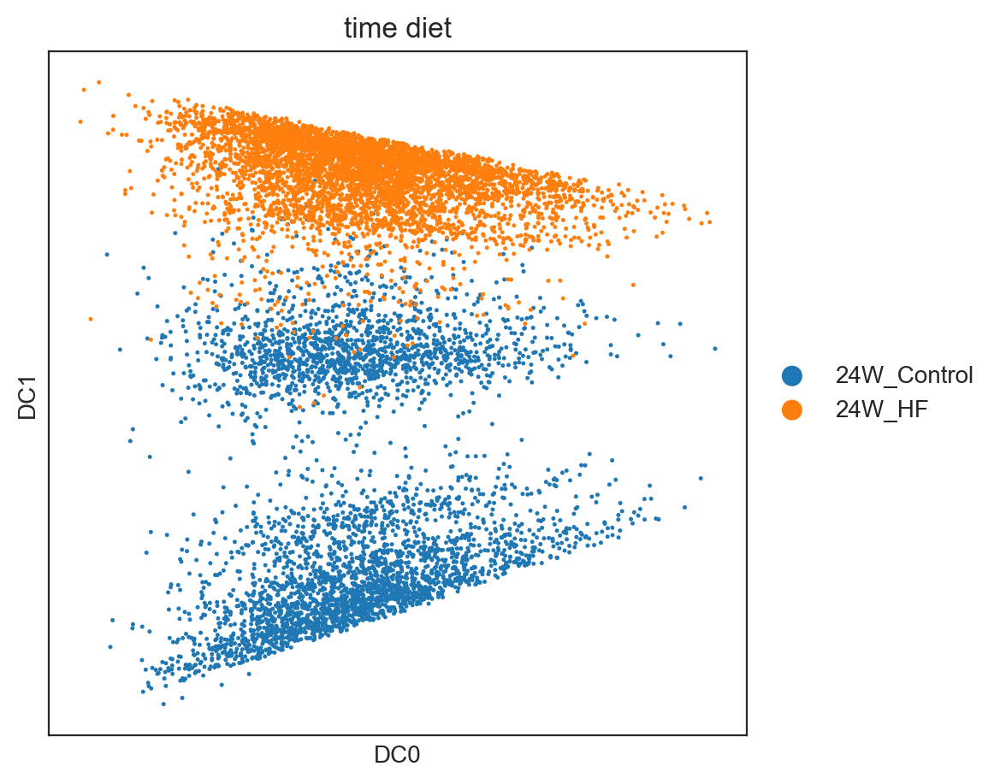

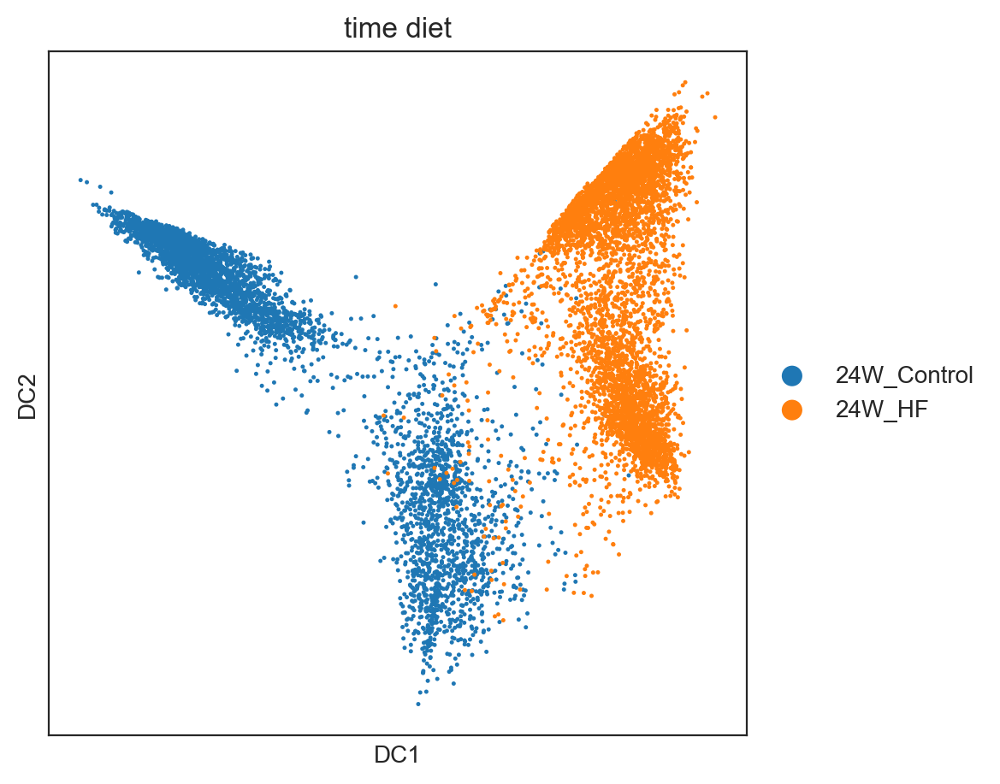

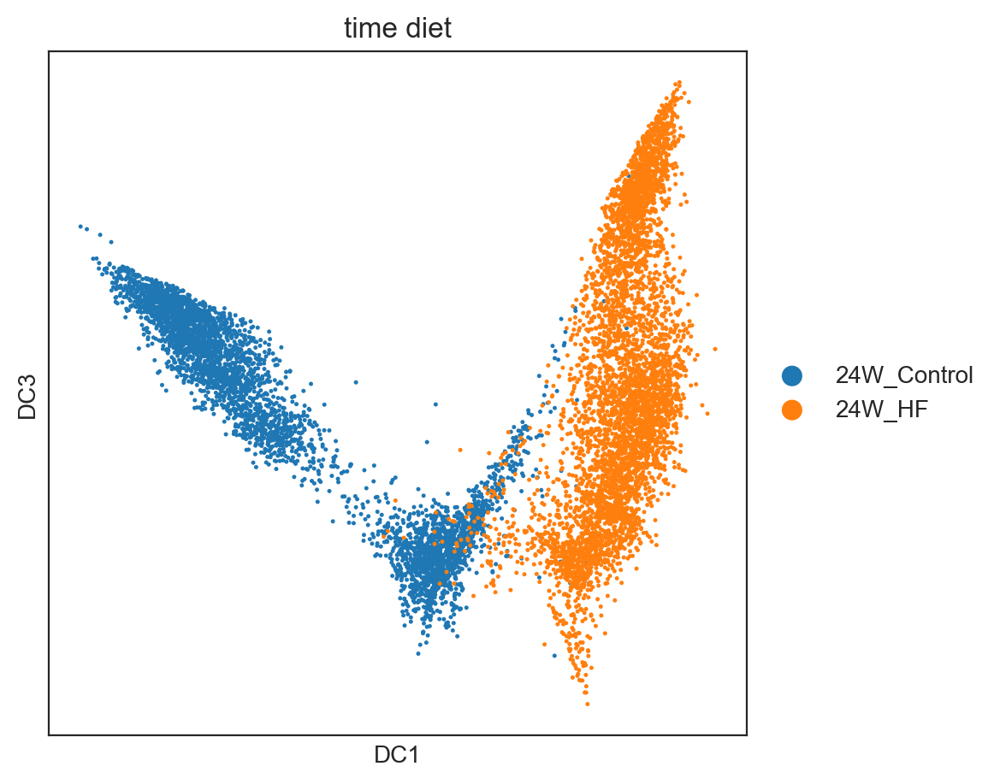

In [28]:
root_ixs =adata.obsm["X_diffmap"][:, 1].argmin()

sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["time_diet"])

sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["time_diet"],
    components=[0, 1],
)
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["time_diet"],
    components=[1, 2],
)
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["time_diet"],
    components=[1, 3],
)
adata.uns["iroot"] = root_ixs

In [29]:
sc.tl.dpt(adata) 

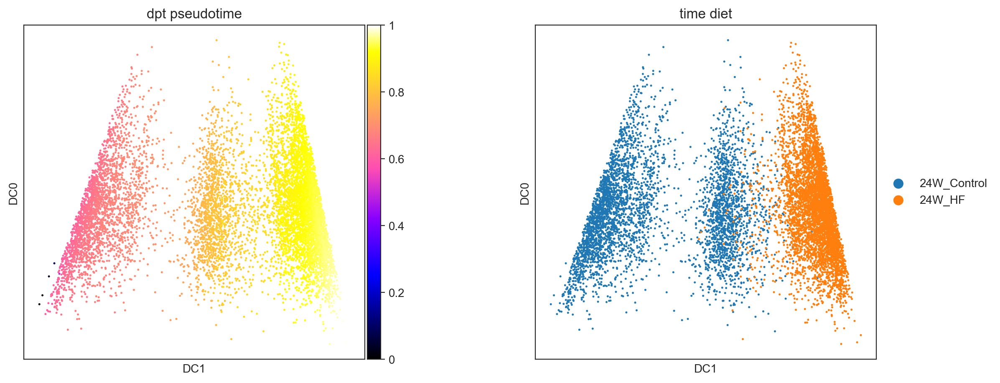

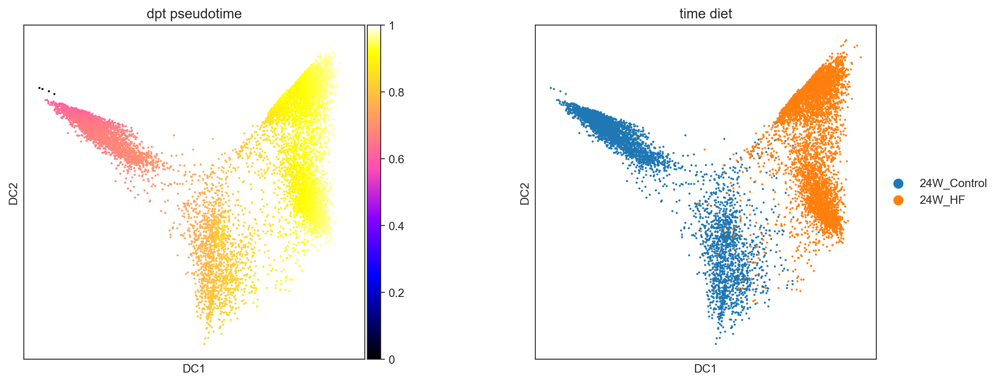

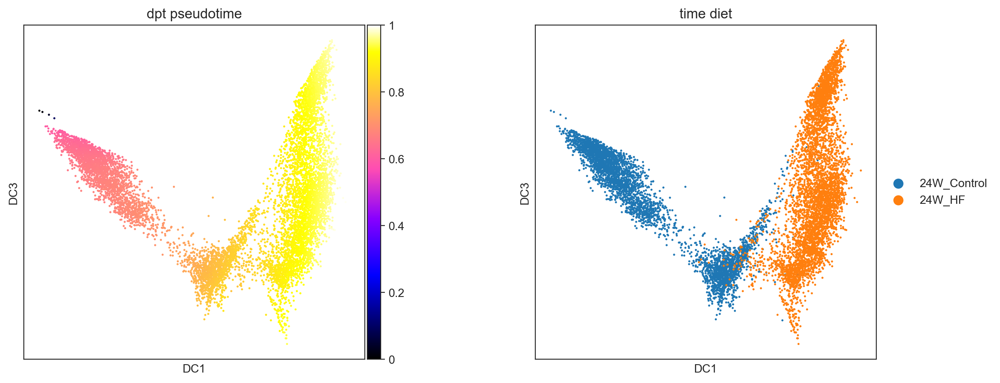

In [30]:
# Plot psedotime on diffusion map
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["dpt_pseudotime", "time_diet"],
    color_map="gnuplot2",
     components=[1, 0]
)
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["dpt_pseudotime", "time_diet"],
    color_map="gnuplot2",
     components=[1, 2]
)
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["dpt_pseudotime", "time_diet"],
    color_map="gnuplot2",
     components=[1, 3]
)

In [31]:
sc.tl.umap(adata)

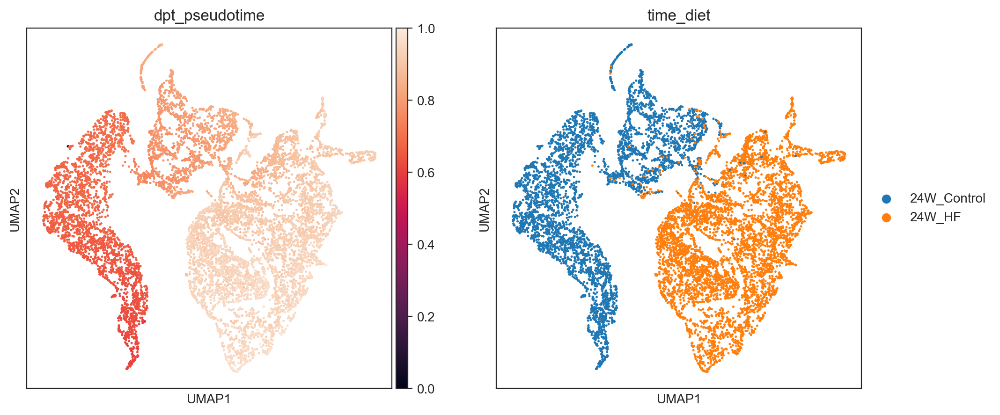

In [32]:
sc.pl.umap(adata, color=['dpt_pseudotime', 'time_diet'],ncols=2)

# Starting GRN Model Construction and Network Analysis 
https://morris-lab.github.io/CellOracle.documentation/notebooks/04_Network_analysis/Network_analysis_with_Paul_etal_2015_data.html

In [33]:
import os
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns


import celloracle as co
co.__version__



'0.18.0'

In [34]:
# visualization settings
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

plt.rcParams['figure.figsize'] = [6, 4.5]
plt.rcParams["savefig.dpi"] = 300

In [35]:
save_folder = "24W_Female_Figures"
os.makedirs(save_folder, exist_ok=True)



In [36]:
# Load the built int rat promoter base GRN.
base_GRN = co.data.load_rat_promoter_base_GRN()

# Check data
base_GRN.head()



Loading prebuilt promoter base-GRN. Version: rn6_gimmemotifsv5_fpr2


,peak_id,gene_short_name,9430076c15rik,Ac002126.6,Ac012531.1,Ac226150.2,Afp,Ahr,Ahrr,Aire,...,Znf784,Znf8,Znf816,Znf85,Zscan10,Zscan16,Zscan22,Zscan26,Zscan31,Zscan4
0,chr10_101287528_101288628,Sox9,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,chr10_101696238_101697338,Mir297,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
2,chr10_102083380_102084480,Slc39a11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,chr10_102135283_102136383,Sstr2,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,chr10_102166771_102167871,Cog1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [37]:
# Instantiate Oracle object
oracle = co.Oracle()

In [38]:
# In this notebook, we use the unscaled mRNA count for the input of Oracle object.
adata.X = adata.layers["raw_count"].copy()

# Instantiate Oracle object.
oracle.import_anndata_as_raw_count(adata=adata,
                                   cluster_column_name="time_diet",
                                   embedding_name="X_diffmap")

In [39]:
oracle.import_TF_data(TF_info_matrix=base_GRN)

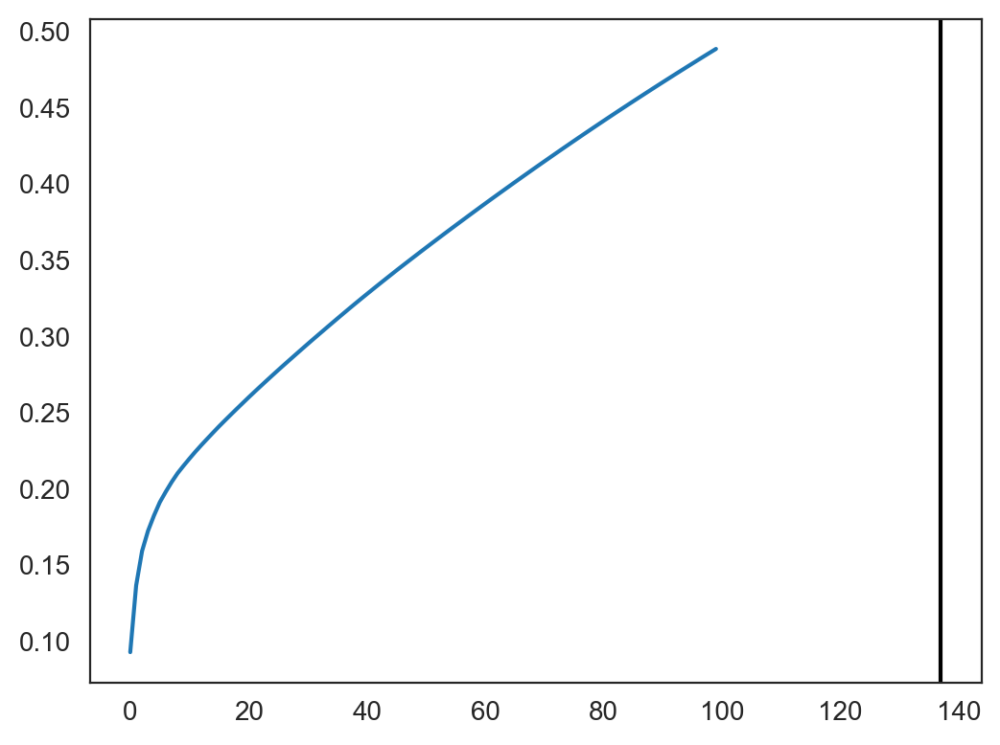

137


In [40]:
# Perform PCA
oracle.perform_PCA()

# Select important PCs
plt.plot(np.cumsum(oracle.pca.explained_variance_ratio_)[:100])
n_comps = np.where(np.diff(np.diff(np.cumsum(oracle.pca.explained_variance_ratio_))>0.002))[0][0]
plt.axvline(n_comps, c="k")
plt.show()
print(n_comps)
n_comps = min(n_comps, 50)



In [41]:
n_cell = oracle.adata.shape[0]
print(f"cell number is :{n_cell}")

cell number is :9344


In [42]:
k = int(0.025*n_cell)
print(f"Auto-selected k is :{k}")


Auto-selected k is :233


In [43]:
oracle.knn_imputation(n_pca_dims=n_comps, k=k, balanced=True, b_sight=k*8,
                      b_maxl=k*4, n_jobs=-1)

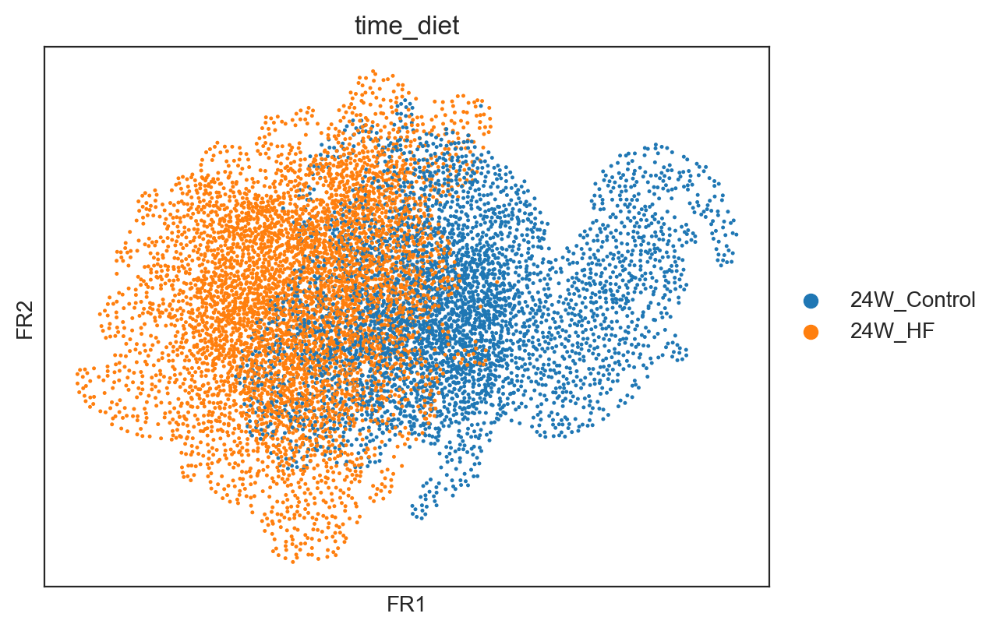

In [44]:
# Check clustering data
sc.pl.draw_graph(oracle.adata, color="time_diet")

In [45]:
%%time
# This step may take some time.(~30 minutes)
links = oracle.get_links(cluster_name_for_GRN_unit="time_diet", alpha=10,
                         verbose_level=10, n_jobs=-1)



  0%|          | 0/2 [00:00<?, ?it/s]

Inferring GRN for 24W_Control...


  0%|          | 0/1412 [00:00<?, ?it/s]

Inferring GRN for 24W_HF...


  0%|          | 0/1412 [00:00<?, ?it/s]

CPU times: user 1min, sys: 5.75 s, total: 1min 6s
Wall time: 1min 52s


In [46]:
links.links_dict.keys()



dict_keys(['24W_Control', '24W_HF'])

In [47]:
links.filter_links(p=0.001, weight="coef_abs", threshold_number=2000)

24W_Control


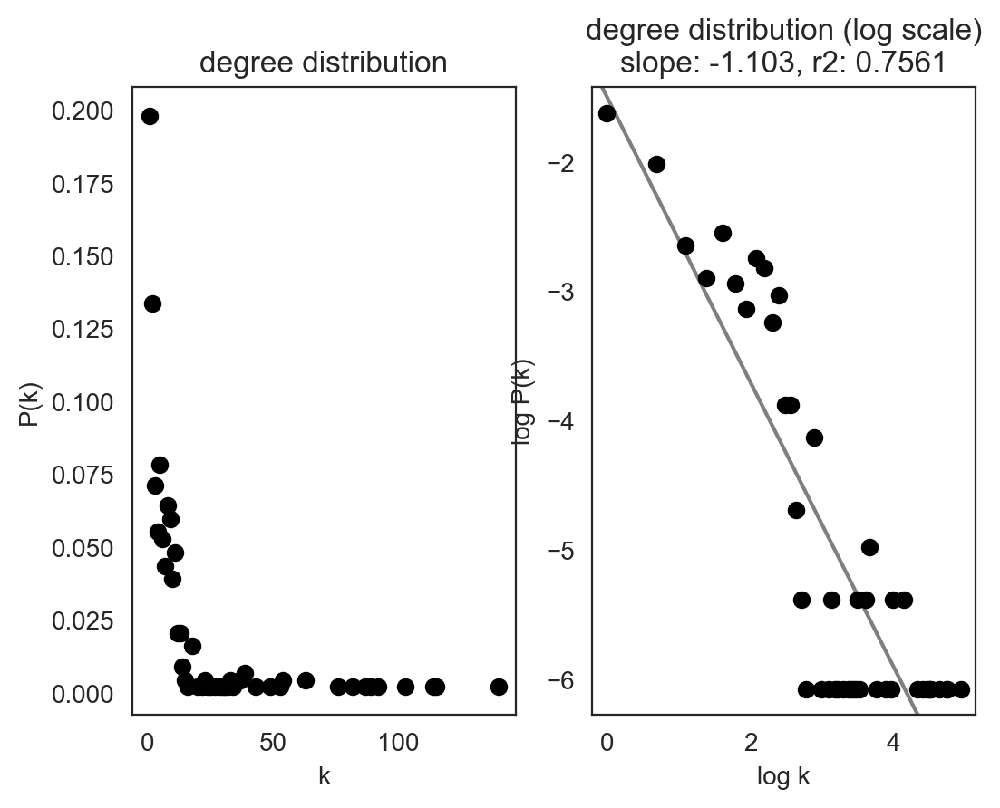

24W_HF


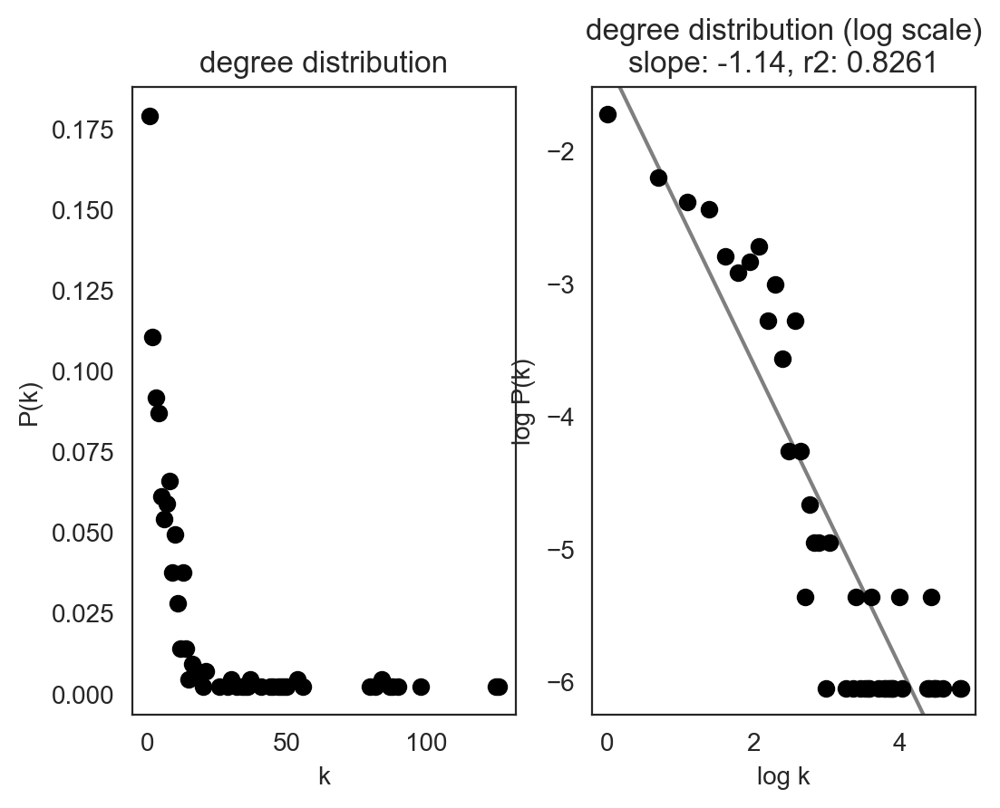

In [48]:
links.plot_degree_distributions(plot_model=True,
                                               #save=f"{save_folder}/degree_distribution/",
                                               )



In [49]:
plt.rcParams["figure.figsize"] = [6, 4.5]


# Calculate network scores.
links.get_network_score()



In [50]:
TFs = oracle.adata.var[oracle.adata.var['isin_TFdict_regulators']].index

In [51]:
TFs

Index(['Ascl1', 'Atf3', 'Atoh8', 'Bcl11a', 'Bcl6', 'Bhlhe40', 'Bhlhe41',
       'Cebpb', 'Creb5', 'Dbx1', 'Dlx1', 'Dlx5', 'Dmrt2', 'Dmrt3', 'Ebf1',
       'Egr1', 'Elf4', 'Elk3', 'En2', 'Epas1', 'Erg', 'Ets1', 'Fli1', 'Fos',
       'Fosb', 'Fosl1', 'Gli2', 'Gli3', 'Glis3', 'Hes1', 'Hes7', 'Hivep2',
       'Hlx', 'Hmga2', 'Hoxb6', 'Id1', 'Irf4', 'Jun', 'Jund', 'Klf10', 'Klf11',
       'Klf12', 'Klf2', 'Klf4', 'Klf7', 'Lhx6', 'Mafg', 'Mecom', 'Mef2c',
       'Meox2', 'Myc', 'Nfatc4', 'Nfia', 'Nfib', 'Nkx2-3', 'Npas3', 'Nr1h2',
       'Nr2f2', 'Nr4a1', 'Nr4a2', 'Nr4a3', 'Nr5a2', 'Onecut3', 'Pax6', 'Pgr',
       'Plagl1', 'Pou2f2', 'Pou3f2', 'Pou6f1', 'Ppara', 'Pparg', 'Ppargc1a',
       'Prdm16', 'Prox1', 'Prrx1', 'Rfx8', 'Rora', 'Rxra', 'Rxrg', 'Six2',
       'Sox13', 'Sox21', 'Sp7', 'Srebf1', 'Tbx5', 'Tcf21', 'Tcf7l1', 'Tead4',
       'Tfap2d', 'Tfec', 'Thra', 'Vsx1', 'Zbtb17', 'Zfp42'],
      dtype='object')

In [52]:
links_df = links.merged_score.copy()

In [53]:
links_df

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
Srebf1,76,0.175520,11,0.025404,65,0.150115,1664.0,0.720524,24W_Control
Ppargc1a,63,0.145497,12,0.027714,51,0.117783,1973.0,1.000000,24W_Control
Cebpb,114,0.263279,2,0.004619,112,0.258661,1697.0,0.915770,24W_Control
Acaca,9,0.020785,9,0.020785,0,0.000000,0.0,0.296657,24W_Control
Npas3,53,0.122402,0,0.000000,53,0.122402,0.0,0.407901,24W_Control
...,...,...,...,...,...,...,...,...,...
Mavs,1,0.002364,1,0.002364,0,0.000000,0.0,0.003494,24W_HF
Sat1,1,0.002364,1,0.002364,0,0.000000,0.0,0.002743,24W_HF
Slc30a3,1,0.002364,1,0.002364,0,0.000000,0.0,0.006118,24W_HF
Gcdh,1,0.002364,1,0.002364,0,0.000000,0.0,0.006096,24W_HF


In [54]:
# Creating a dataframe that includes only transcription factors
TF_links_df = links_df.loc[links_df.index.isin(TFs)]


In [55]:
TF_links_df 

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
Srebf1,76,0.175520,11,0.025404,65,0.150115,1664.0,0.720524,24W_Control
Ppargc1a,63,0.145497,12,0.027714,51,0.117783,1973.0,1.000000,24W_Control
Cebpb,114,0.263279,2,0.004619,112,0.258661,1697.0,0.915770,24W_Control
Npas3,53,0.122402,0,0.000000,53,0.122402,0.0,0.407901,24W_Control
Atf3,115,0.265589,0,0.000000,115,0.265589,0.0,0.739282,24W_Control
...,...,...,...,...,...,...,...,...,...
Jund,8,0.018913,0,0.000000,8,0.018913,0.0,0.016802,24W_HF
Onecut3,3,0.007092,0,0.000000,3,0.007092,0.0,0.008297,24W_HF
Nkx2-3,1,0.002364,0,0.000000,1,0.002364,0.0,0.000522,24W_HF
Glis3,1,0.002364,0,0.000000,1,0.002364,0.0,0.002608,24W_HF


# Save links and oracles object (optional)

In [56]:
oracle_and_links_save_path = '/Users/derekebowman/Coding Projects/taPVAT_snRNAseq_analysis/code/scVelo_and_CellOracle/CellOracle/August2025/OracleLinksObjects'


links.to_hdf5(file_path=oracle_and_links_save_path+"/August_Female_24W.celloracle.links")
oracle.to_hdf5(file_path=oracle_and_links_save_path+"/August_Female_24W.celloracle.oracle")

# In Silico Gene Perturbation with GRNs
https://morris-lab.github.io/CellOracle.documentation/notebooks/05_simulation/Gata1_KO_simulation_with_Paul_etal_2015_data.html#Notebook-file

In [57]:
import os
import sys
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import celloracle as co
co.__version__


'0.18.0'

In [58]:
#plt.rcParams["font.family"] = "arial"
plt.rcParams["figure.figsize"] = [6,6]
%config InlineBackend.figure_format = 'retina'
plt.rcParams["savefig.dpi"] = 600

%matplotlib inline



# Load the links and oracle datasets, if you've already generated them

In [59]:
# # Attention!! Please use the function below when you use your data.
# oracle = co.load_hdf5('/Users/derekebowman/Coding Projects/taPVAT_snRNAseq_analysis/code/scVelo_and_CellOracle/CellOracle/August2025/OracleLinksObjects/August_Female_24W.celloracle.oracle')
# # Attention!! Please use the function below when you use your data.
# links = co.load_hdf5('/Users/derekebowman/Coding Projects/taPVAT_snRNAseq_analysis/code/scVelo_and_CellOracle/CellOracle/August2025/OracleLinksObjects/August_Female_24W.celloracle.links')

In [60]:
tfs_of_interest = ['SNAI2', 'TSHZ3', 'NKX21', 'TWIST1', 'TWIST2', 'FOXL1', 'PPARG', 'FOXF2', 'MKX', 'SOX11']



In [61]:
tfs_of_interest = [tf.capitalize() for tf in tfs_of_interest]
len(tfs_of_interest)

10

In [62]:
links.filtered_links

{'24W_Control':        source    target  coef_mean  coef_abs             p      -logp
 18614  Srebf1  Ppargc1a  -0.446343  0.446343  4.671616e-15  14.330533
 413     Cebpb     Acaca   0.415362  0.415362  1.146899e-09   8.940475
 16428   Npas3     Ntrk3   0.410640  0.410640  3.586827e-14  13.445290
 9721     Atf3      Gmpr   0.401127  0.401127  9.995979e-22  21.000175
 18623    Irf4  Ppargc1a   0.380146  0.380146  1.216675e-07   6.914825
 ...       ...       ...        ...       ...           ...        ...
 5796    Pparg      Ctsa  -0.019549  0.019549  2.283997e-10   9.641304
 3456     Ebf1   Camsap3  -0.019538  0.019538  2.246299e-09   8.648532
 26013  Zbtb17     Vegfa   0.019533  0.019533  4.009434e-15  14.396917
 14649   Klf12     Mms19  -0.019510  0.019510  4.125779e-14  13.384494
 9524    Nr4a3      Git1  -0.019507  0.019507  3.172052e-06   5.498660
 
 [2000 rows x 6 columns],
 '24W_HF':        source    target  coef_mean  coef_abs             p      -logp
 8567     Fli1      Fhit

In [63]:
list_of_tfs = list(links.filtered_links['24W_HF']['source'].unique())
list_of_tfs.sort()
candidate_tfs = list(set(list_of_tfs).intersection(tfs_of_interest))
print(candidate_tfs)


['Pparg']


In [64]:
links.filter_links()
oracle.get_cluster_specific_TFdict_from_Links(links_object=links)
oracle.fit_GRN_for_simulation(alpha=10,
                              use_cluster_specific_TFdict=True)



  0%|          | 0/2 [00:00<?, ?it/s]

In [65]:
oracle.adata.obsm

AxisArrays with keys: X_pca, X_diffmap, X_draw_graph_fr, X_draw_graph_fa, X_umap

In [66]:
oracle.embedding = oracle.adata.obsm['X_umap'] 
oracle.embedding_name = 'X_umap'

In [67]:
oracle.embedding_name 

'X_umap'

In [68]:


goi = 'Pparg'

In [69]:
oracle.simulate_shift(perturb_condition={goi: 0.0})

In [70]:
%%time
# Get transition probability
oracle.estimate_transition_prob(n_neighbors=200,
                                knn_random=True,
                                sampled_fraction=1)

# Calculate embedding
oracle.calculate_embedding_shift(sigma_corr=0.05)

CPU times: user 58.4 s, sys: 17.4 s, total: 1min 15s
Wall time: 23.3 s


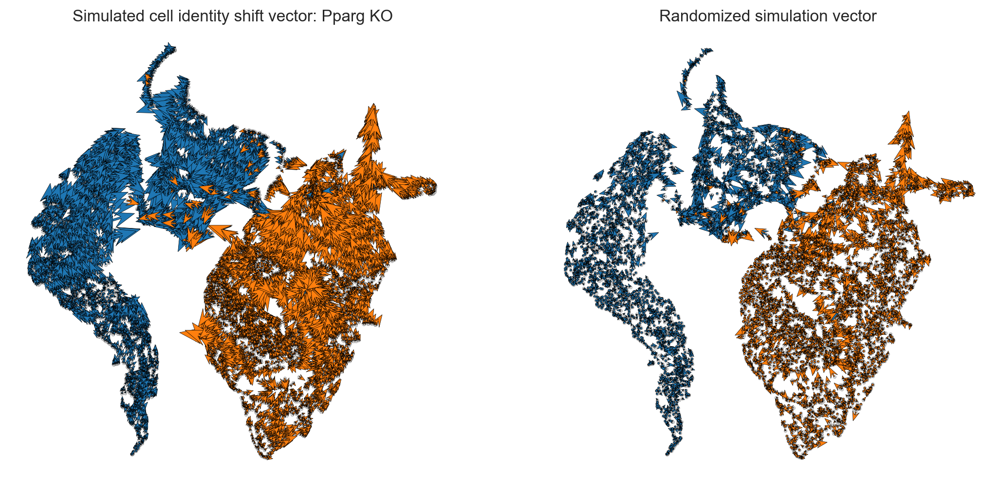

In [71]:
fig, ax = plt.subplots(1, 2,  figsize=[13, 6])

scale = 25
# Show quiver plot
oracle.plot_quiver(scale=scale, ax=ax[0])
ax[0].set_title(f"Simulated cell identity shift vector: {goi} KO")

# Show quiver plot that was calculated with randomized graph.
oracle.plot_quiver_random(scale=scale, ax=ax[1])
ax[1].set_title(f"Randomized simulation vector")

plt.show()

In [72]:
# n_grid = 40 is a good starting value.
n_grid = 40
oracle.calculate_p_mass(smooth=0.8, n_grid=n_grid, n_neighbors=200)

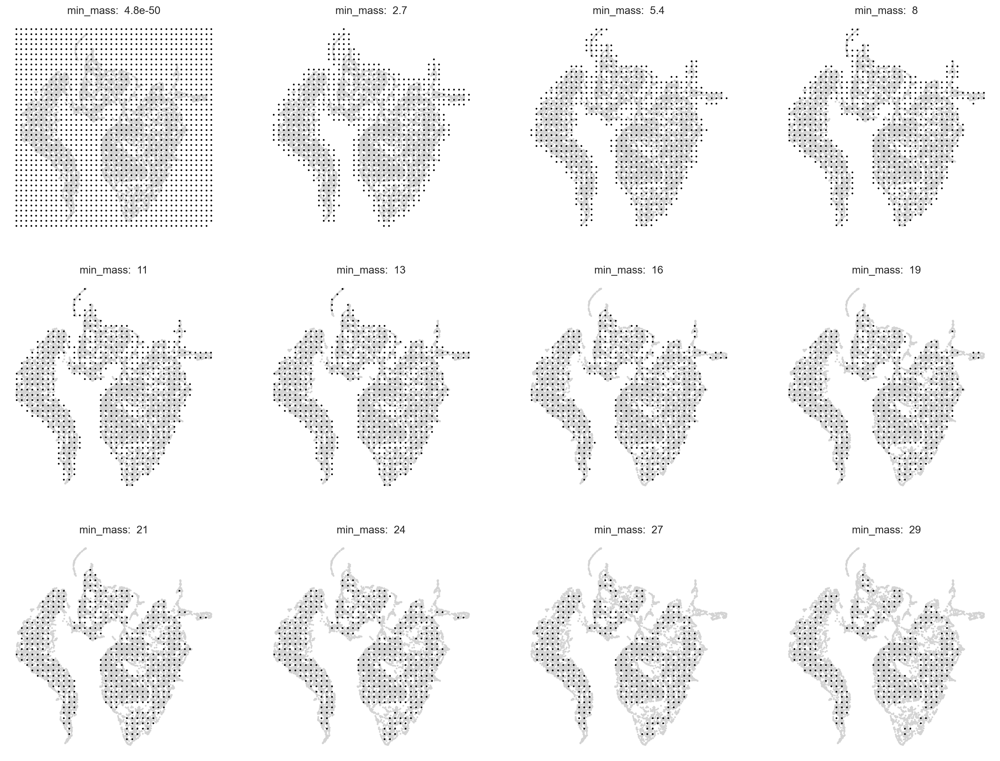

In [73]:
# Search for best min_mass.
oracle.suggest_mass_thresholds(n_suggestion=12)



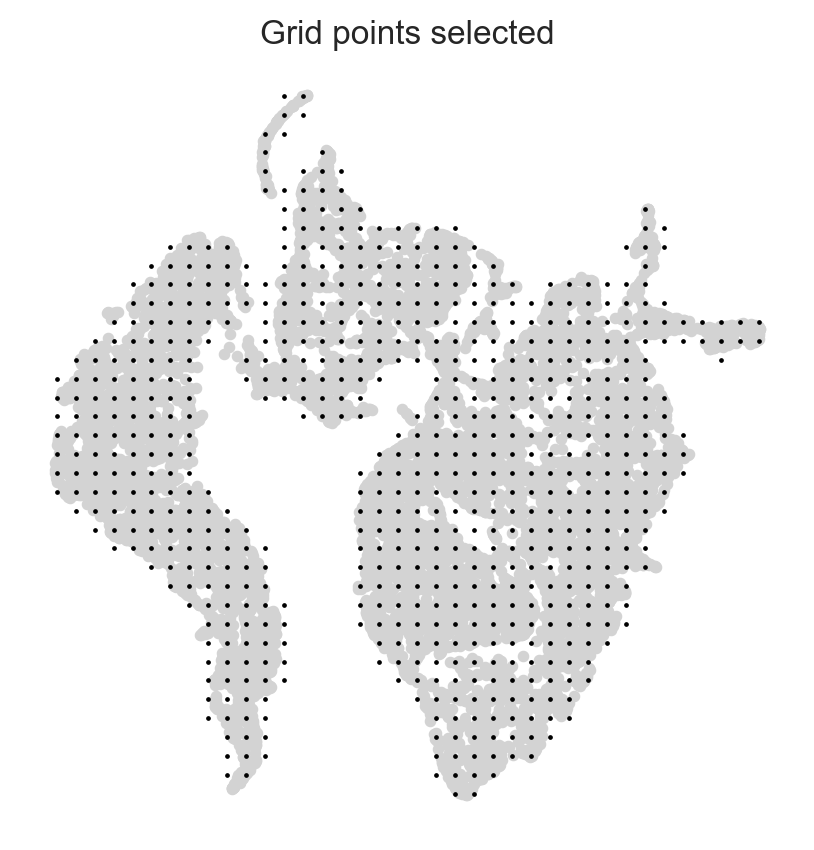

In [74]:
min_mass = 10  #1.5 #2.9e+04  # 5e+03 4.9e+03 #1.9e+04
oracle.calculate_mass_filter(min_mass=min_mass, plot=True)

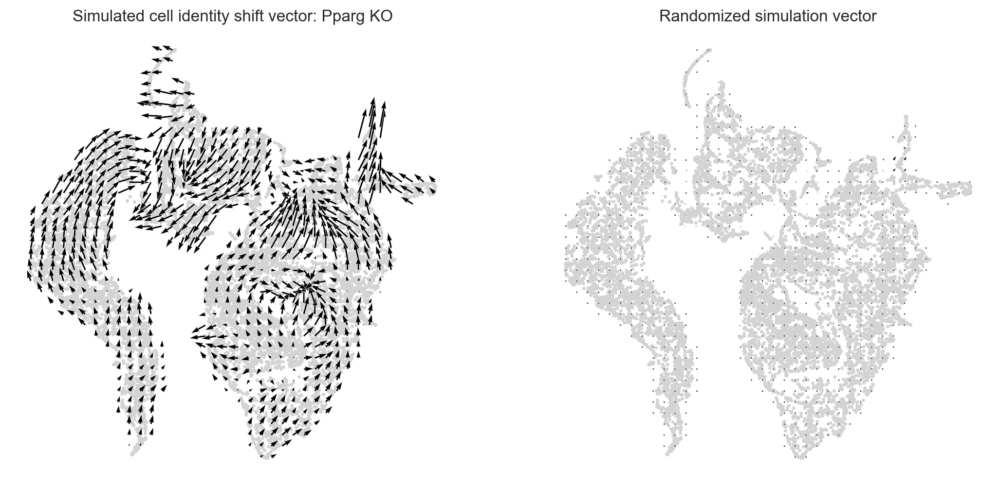

In [75]:
fig, ax = plt.subplots(1, 2,  figsize=[13, 6])

scale_simulation = 15
# Show quiver plot
oracle.plot_simulation_flow_on_grid(scale=scale_simulation, ax=ax[0])
ax[0].set_title(f"Simulated cell identity shift vector: {goi} KO")

# Show quiver plot that was calculated with randomized graph.
oracle.plot_simulation_flow_random_on_grid(scale=scale_simulation, ax=ax[1])
ax[1].set_title(f"Randomized simulation vector")

plt.show()

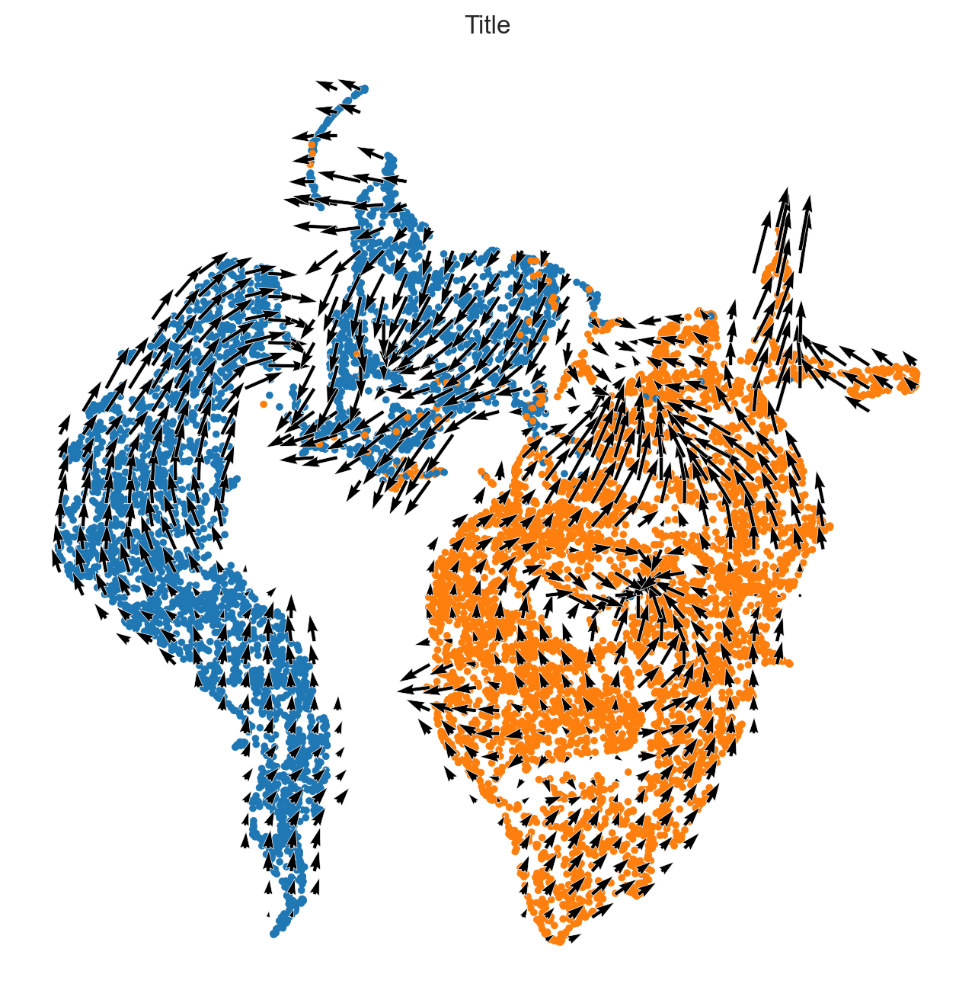

In [76]:
# Plot vector field with cell cluster
fig, ax = plt.subplots(figsize=[8, 8])

oracle.plot_cluster_whole(ax=ax, s=10)
oracle.plot_simulation_flow_on_grid(scale=scale_simulation, ax=ax, show_background=False)

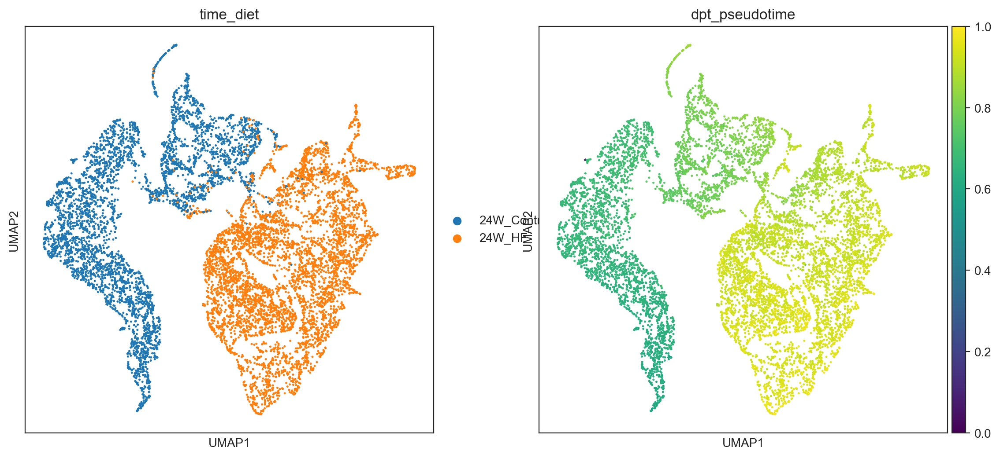

In [77]:
sc.pl.umap(oracle.adata, color=[oracle.cluster_column_name, 'dpt_pseudotime'],
                 layer="imputed_count", use_raw=False, cmap="viridis", ncols = 2)

# Compare Simulation Vector with Development Vectors

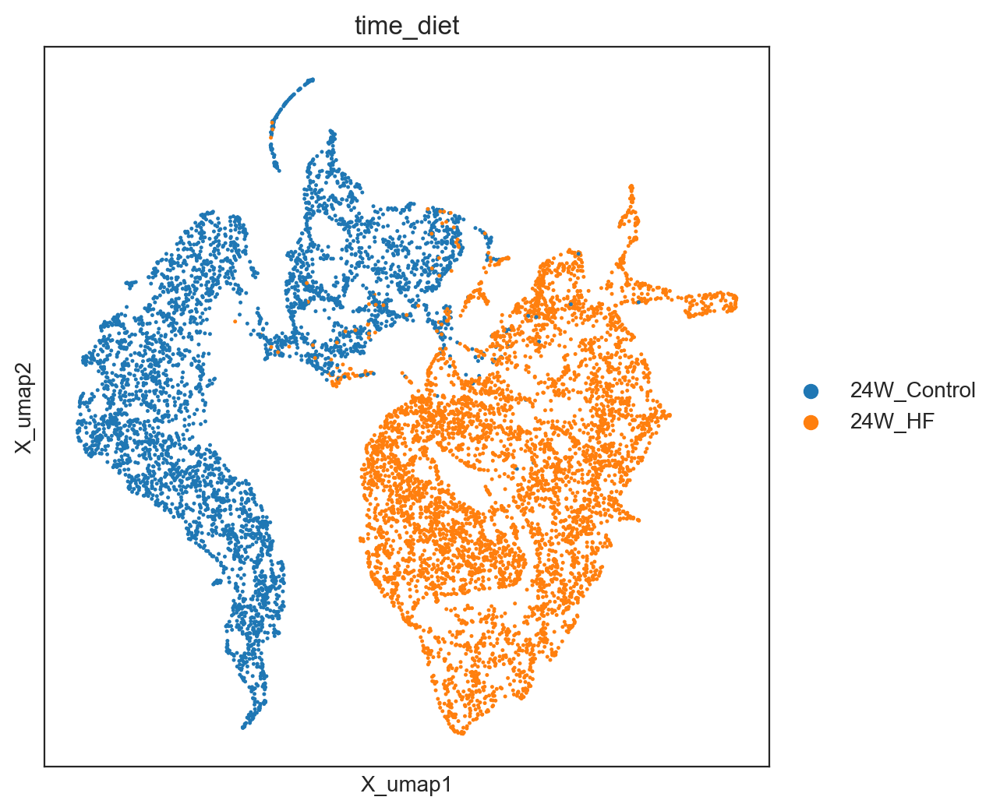

In [78]:
# Visualize pseudotime
fig, ax = plt.subplots(figsize=[6,6])

sc.pl.embedding(adata=oracle.adata, basis=oracle.embedding_name, ax=ax, cmap="rainbow",
                color=['time_diet'])

In [79]:
from celloracle.applications import Gradient_calculator

# Instantiate Gradient calculator object
gradient = Gradient_calculator(oracle_object=oracle, pseudotime_key="dpt_pseudotime")


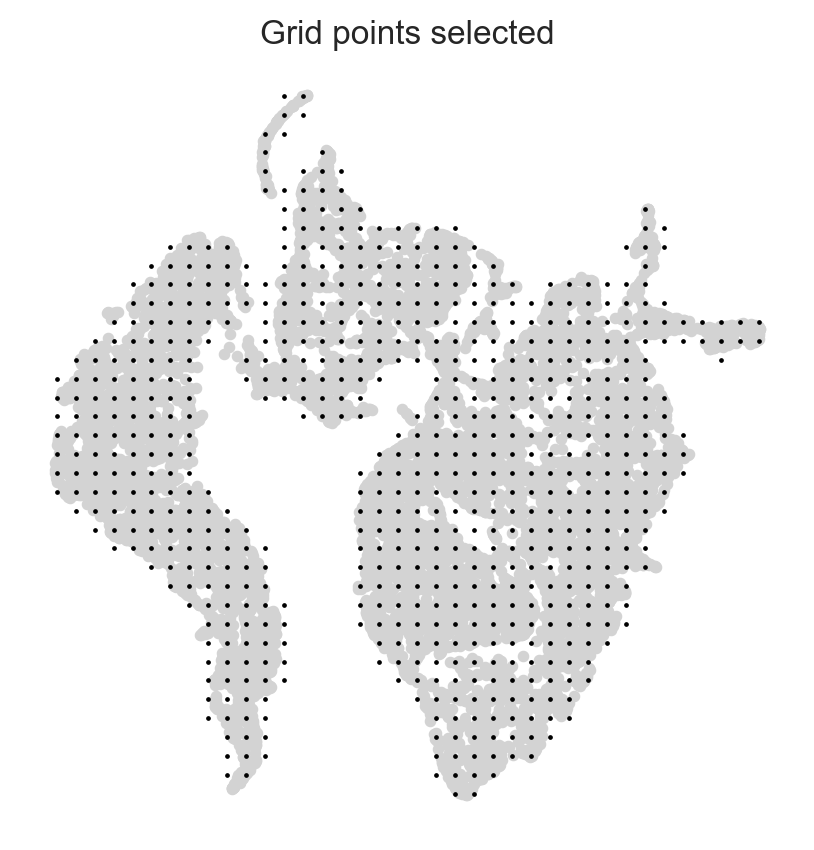

In [80]:
gradient.calculate_p_mass(smooth=0.8, n_grid=n_grid, n_neighbors=200)
gradient.calculate_mass_filter(min_mass=min_mass, plot=True)

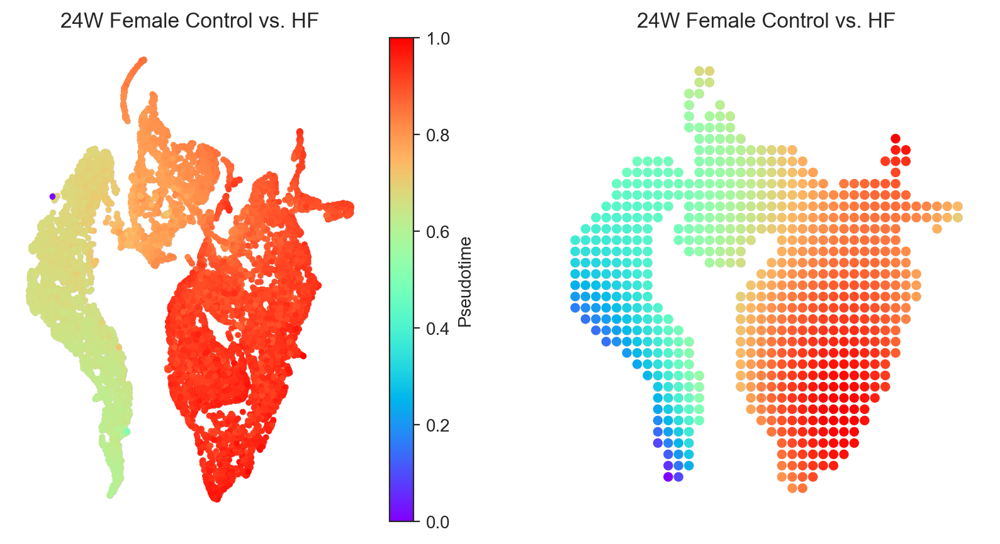

In [81]:
gradient.transfer_data_into_grid(args={"method": "polynomial", "n_poly":3}, plot=True, title ='24W Female Control vs. HF')

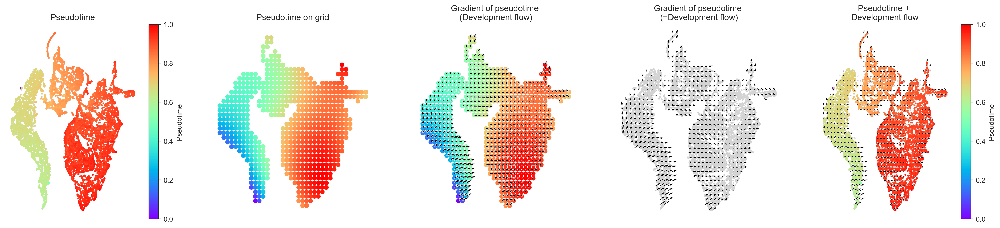

In [82]:
# Calculate graddient
gradient.calculate_gradient()

# Show results
scale_dev = 40
gradient.visualize_results(scale=scale_dev, s=5)



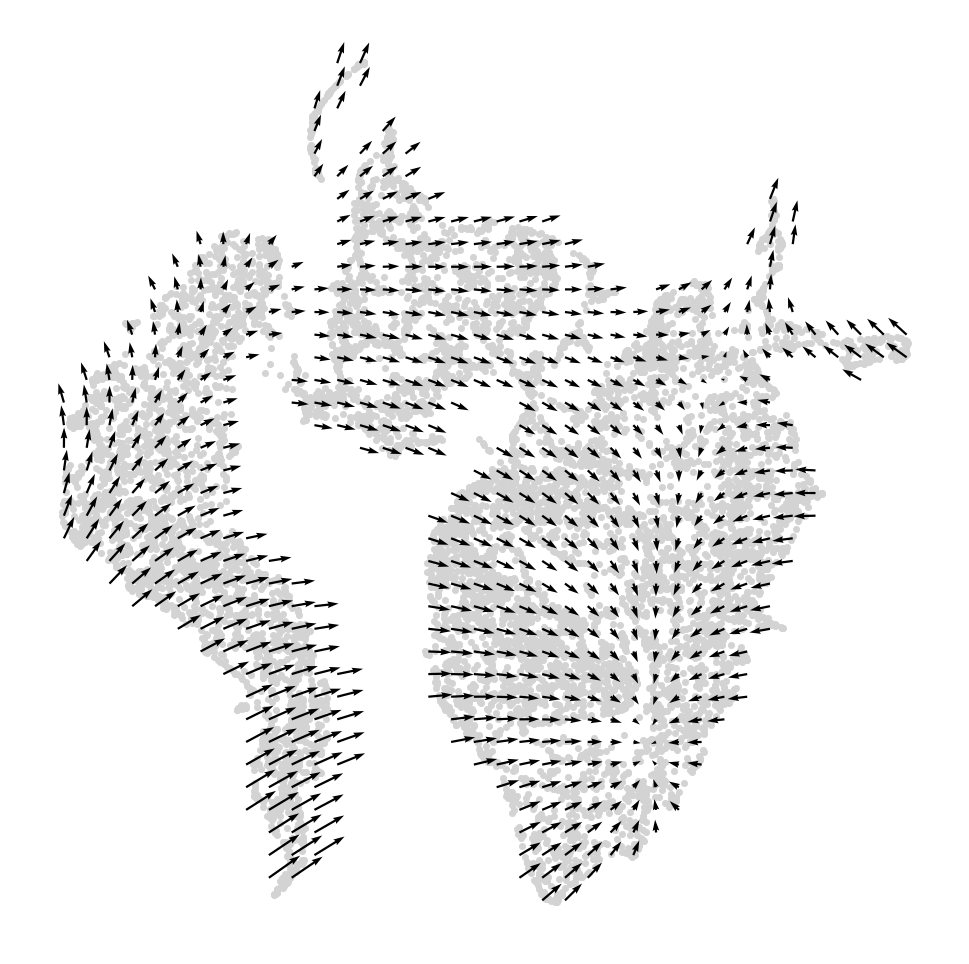

In [83]:
# Visualize results
fig, ax = plt.subplots(figsize=[6, 6])
gradient.plot_dev_flow_on_grid(scale=scale_dev, ax=ax)

In [84]:
from celloracle.applications import Oracle_development_module

# Make Oracle_development_module to compare two vector field
dev = Oracle_development_module()

# Load development flow
dev.load_differentiation_reference_data(gradient_object=gradient)

# Load simulation result
dev.load_perturb_simulation_data(oracle_object=oracle)


# Calculate inner produc scores
dev.calculate_inner_product()
dev.calculate_digitized_ip(n_bins=10)



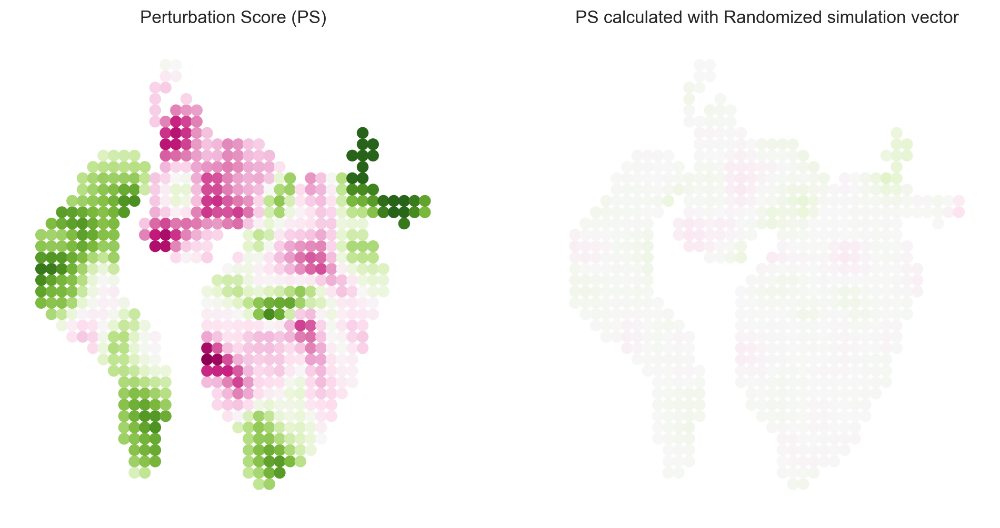

In [85]:
# Show perturbation scores
vm = 0.5

fig, ax = plt.subplots(1, 2, figsize=[12, 6])
dev.plot_inner_product_on_grid(vm=vm, s=50, ax=ax[0])
ax[0].set_title(f"Perturbation Score (PS)")

dev.plot_inner_product_random_on_grid(vm=vm, s=50, ax=ax[1])
ax[1].set_title(f"PS calculated with Randomized simulation vector")
plt.show()



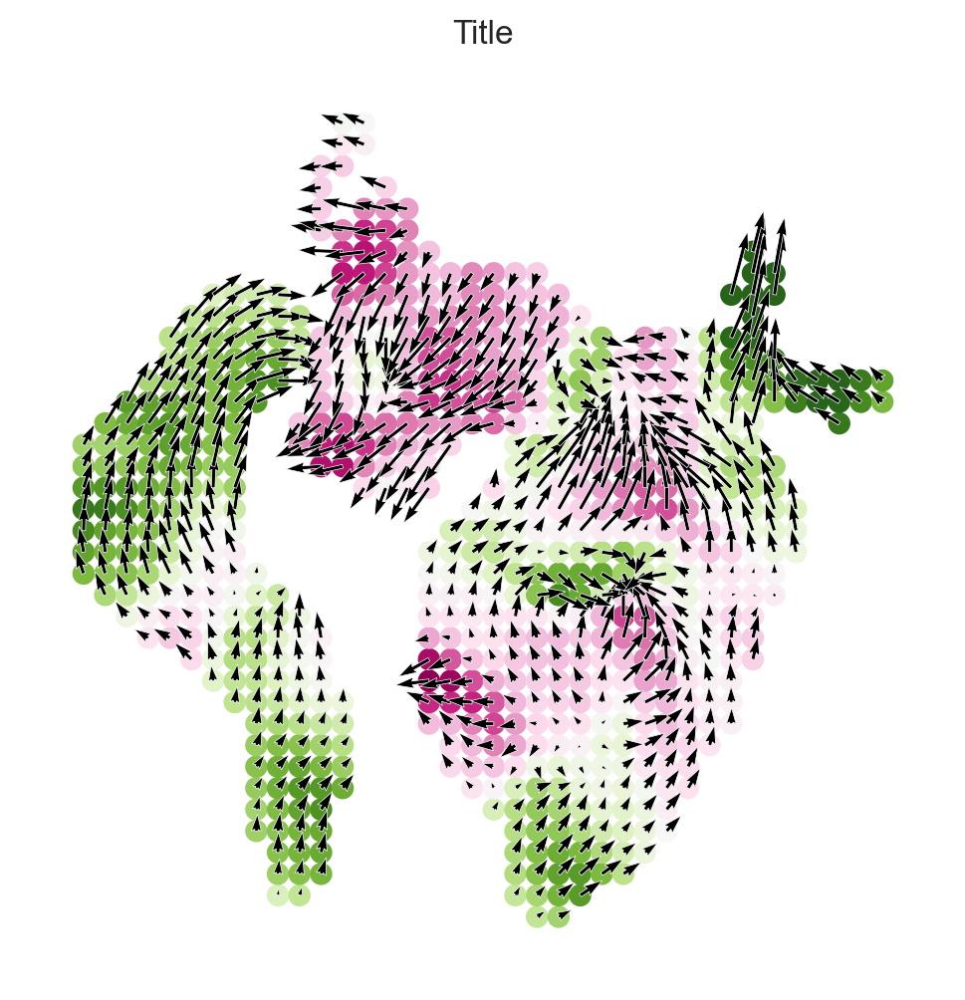

In [86]:
# Show perturbation scores with perturbation simulation vector field
fig, ax = plt.subplots(figsize=[6, 6])
dev.plot_inner_product_on_grid(vm=vm, s=50, ax=ax)
dev.plot_simulation_flow_on_grid(scale=scale_simulation, show_background=False, ax=ax)

2025-08-26 13:58:05,864 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-08-26 13:58:05,867 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


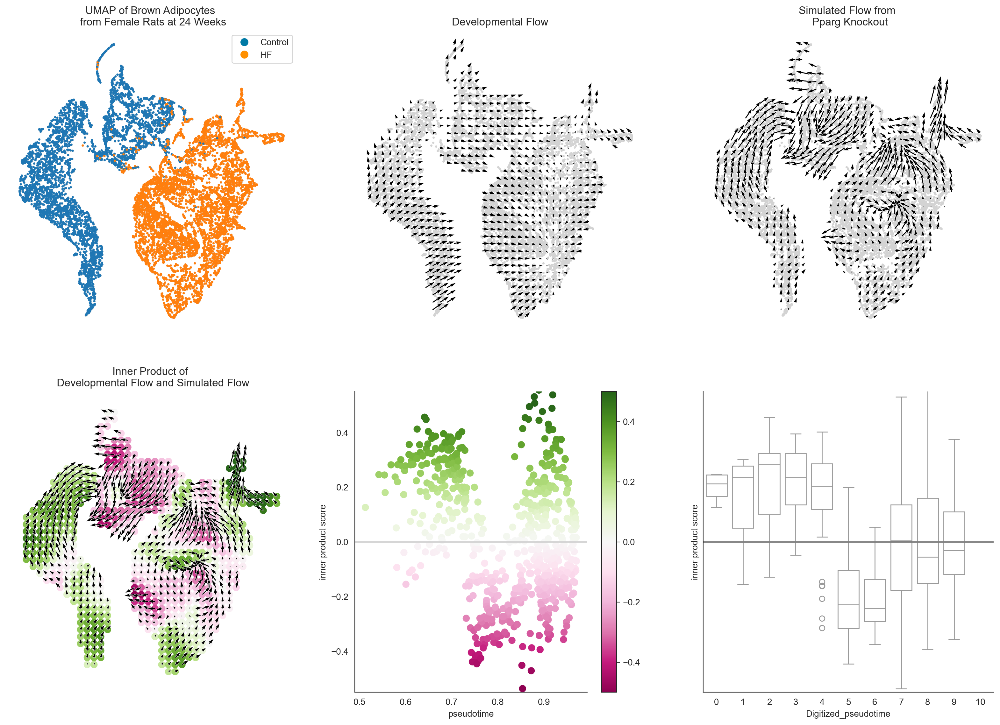

In [87]:
# Let's visualize the results
dev.visualize_development_module_layout_0(s=5,
                                          scale_for_simulation=scale_simulation,
                                          s_grid=50,
                                          scale_for_pseudotime=scale_dev,
                                          vm=vm, title=['UMAP of Brown Adipocytes \n from Female Rats at 24 Weeks','Developmental Flow',f'Simulated Flow from \n {goi} Knockout','Inner Product of \n Developmental Flow and Simulated Flow','',''], 
                                          legend= [['Control', 'HF']], label_colors= ["#007aa5", "#ff9000"] ) # Blue and Orange



